In [7]:
%load_ext autoreload
%autoreload 2
from dpe import DPE
from lib_data import *
import matplotlib.pyplot as plt
import numpy as np
from lib_nn_dpe import NN_dpe
from IPython import display

import serial
%config InlineBackend.figure_formats = ['svg']

import matplotlib
matplotlib.rcParams['font.sans-serif'] = "Arial"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
dpe = DPE('COM3')
dpe.set_clock(50)
dpe.shape

DAC initialized to a span from -10 V to 10 V
Setting vrefs to default
Setting ADC_CK freq=50000.0kHz
Setting CK_ARRAY freq=50000.0kHz


[64, 64]

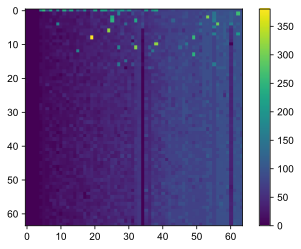

In [9]:
g = dpe.read(1, Tdly=500, method='fast')
plt.imshow(g * 1e6)
plt.colorbar()

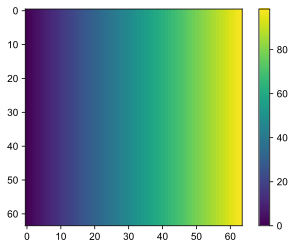

In [15]:
N = 64

Gtarget = np.zeros((N,N))
for c in range(64):
    Gtarget[:,c] = 100e-6 / 64 * c

Msel = Gtarget > 0

plt.imshow(Gtarget * 1e6); plt.colorbar()

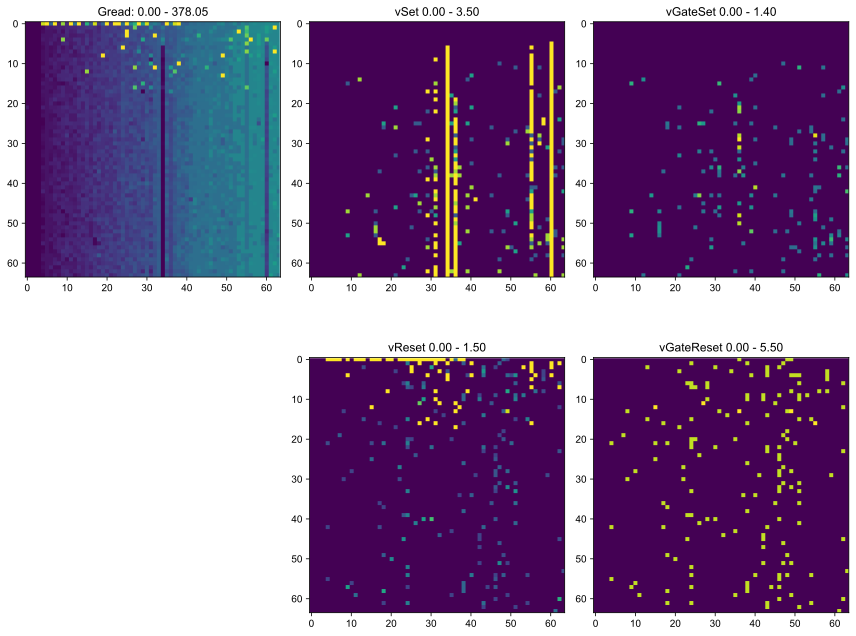

St-art programming, step=199, maxBound=276 yield= 85.74%
Setting 141 devices...
Programming with internal timing P_RESET=2
Resetting 161 devices...
Programming with internal timing P_RESET=2


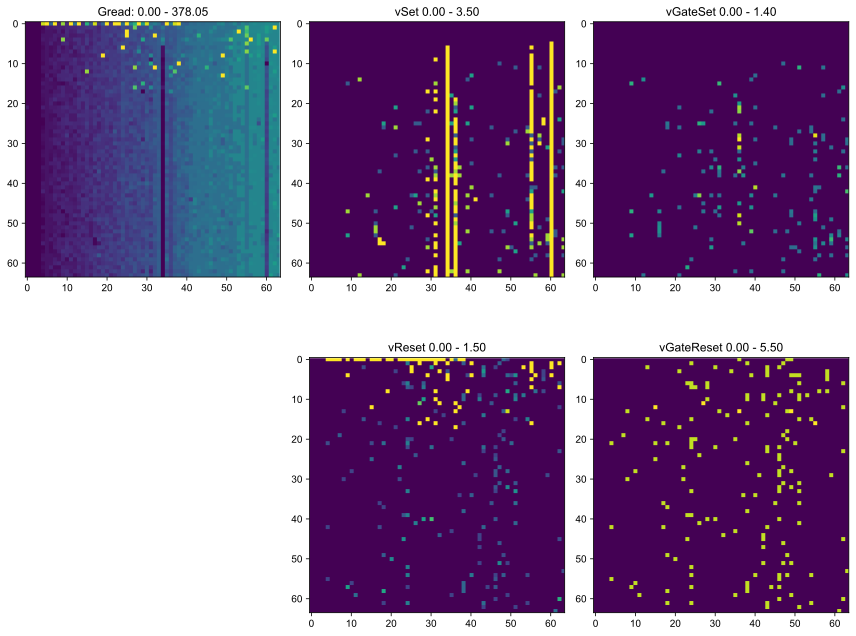

In [16]:
def myplot(data):
    Gread = data['Ghist'][-1]
    vSet = data['vSetHist'][-1]
    vGateSet = data['vGateSetHist'][-1]
    vReset = data['vResetHist'][-1]
    vGateReset = data['vGateResetHist'][-1]
    
    
    plt.figure(1, figsize=(12,10))
    plt.subplot(2,3,1)
    plt.imshow(Gread * 1e6)
    plt.title(f'Gread: {Gread.min()*1e6:.2f} - {Gread.max()*1e6:.2f}')
    plt.clim(0, 200)
    
    plt.subplot(2,3,2)
    plt.imshow(vSet)
    plt.title(f'vSet {vSet.min():.2f} - {vSet.max():.2f}')
    
    plt.subplot(2,3,3)
    plt.imshow(vGateSet )
    plt.title(f'vGateSet {vGateSet.min():.2f} - {vGateSet.max():.2f}')
    
    plt.subplot(2,3,5)
    plt.imshow(vReset)
    plt.title(f'vReset {vReset.min():.2f} - {vReset.max():.2f}')
    
    plt.subplot(2,3,6)
    plt.imshow(vGateReset )
    plt.title(f'vGateReset {vGateReset.min():.2f} - {vGateReset.max():.2f}')
    
    plt.tight_layout()
    
    display.clear_output(wait=True)
    display.display(plt.gcf())

data = dpe.tune_conductance(1,  Gtarget, saveHistory=True, maxSteps=200, method='fast', plot_callback=myplot,
#                            vSetRamp=[1, 5.5, 1], 
#                             Twidth=1e-3, 
                            Msel=Msel)

In [17]:
save_workspace(vars(), note='chip45-array1-gradient')

Saving In(<class 'list'>), Out(<class 'dict'>), g(<class 'numpy.ndarray'>), N(<class 'int'>), c(<class 'int'>), Gtarget(<class 'numpy.ndarray'>), Msel(<class 'numpy.ndarray'>), data(<class 'dict'>), to 20200107-172311-chip45-array1-gradient.pkl
Saving In(<class 'list'>), g(<class 'numpy.ndarray'>), N(<class 'int'>), c(<class 'int'>), Gtarget(<class 'numpy.ndarray'>), Msel(<class 'numpy.ndarray'>), to 20200107-172311-chip45-array1-gradient.mat


....

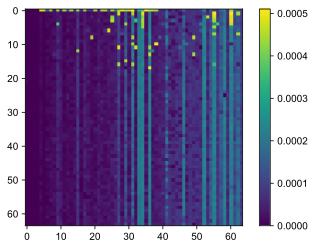

In [19]:
g = dpe.read(1)
plt.imshow(g)
plt.colorbar()

In [21]:
from lib_tune_g import *

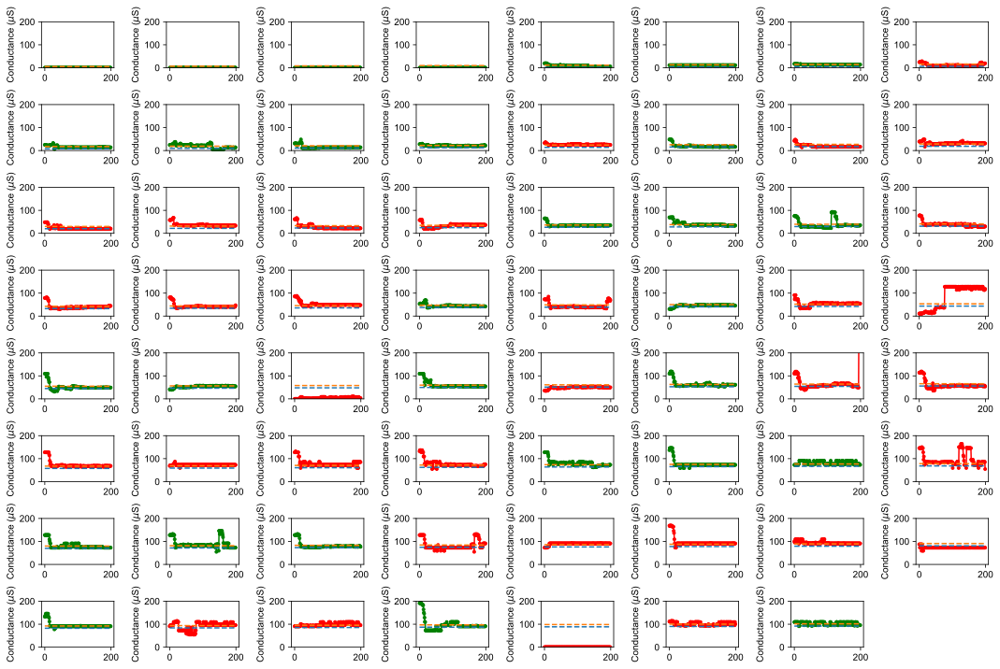

In [26]:
num = 1
plt.figure(figsize=(15,10))

for x in range(64):
    for y in range(64):
        
        if x == 10:
            if num < 64:
                plt.subplot(8,8,num)
                plot_g_history(x, y, data, Gtarget)
                plt.ylim(0, 200)
                num +=1
plt.tight_layout()

In [27]:
g_all = []

for n in range(1000):
    print(n, end='-')
    g = dpe.read(1, method='fast')
    g_all.append(g)

0-1-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-17-18-19-20-21-22-23-24-25-26-27-28-29-30-31-32-33-34-35-36-37-38-39-40-41-42-43-44-45-46-47-48-49-50-51-52-53-54-55-56-57-58-59-60-61-62-63-64-65-66-67-68-69-70-71-72-73-74-75-76-77-78-79-80-81-82-83-84-85-86-87-88-89-90-91-92-93-94-95-96-97-98-99-100-101-102-103-104-105-106-107-108-109-110-111-112-113-114-115-116-117-118-119-120-121-122-123-124-125-126-127-128-129-130-131-132-133-134-135-136-137-138-139-140-141-142-143-144-145-146-147-148-149-150-151-152-153-154-155-156-157-158-159-160-161-162-163-164-165-166-167-168-169-170-171-172-173-174-175-176-177-178-179-180-181-182-183-184-185-186-187-188-189-190-191-192-193-194-195-196-197-198-199-200-201-202-203-204-205-206-207-208-209-210-211-212-213-214-215-216-217-218-219-220-221-222-223-224-225-226-227-228-229-230-231-232-233-234-235-236-237-238-239-240-241-242-243-244-245-246-247-248-249-250-251-252-253-254-255-256-257-258-259-260-261-262-263-264-265-266-267-268-269-270-271-272-273-274-275-276-27

In [ ]:
g_all = np.array(g_all)

y = g_all.reshape(1000, -1)

y_std = []

for vec in y.T:
    plt.plot( range(1000), vec * 1e6, linewidth=0.1)
    plt.ylim(0, 120)
    y_std.append( np.std(vec) )

In [33]:
y_std = np.array(y_std)

y_std[y_std<1e-7] = np.nan

c:\users\localuser\~\.venvs\py37\lib\site-packages\numpy\lib\histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
c:\users\localuser\~\.venvs\py37\lib\site-packages\numpy\lib\histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


Text(0, 0.5, 'Count')

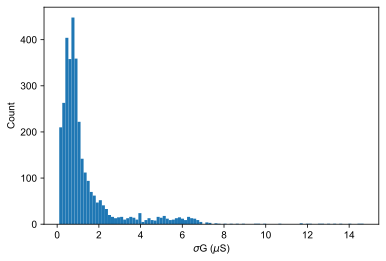

In [34]:
_ = plt.hist(y_std * 1e6, 100)
plt.xlabel('$\sigma$G ($\mu$S)')
plt.ylabel('Count')

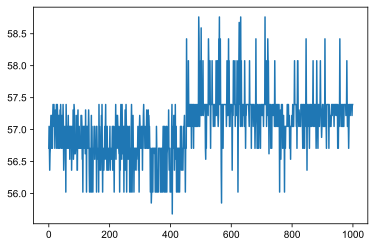

In [36]:
x = 31
y = 35
plt.plot(range(1000), g_all[:,x,y].reshape(-1) * 1e6)

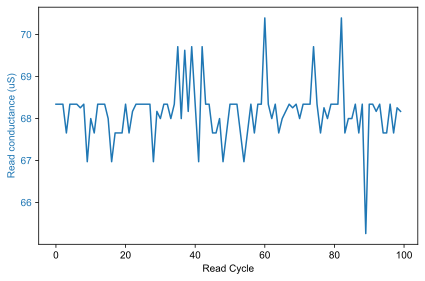

6.724304734825262e-07


In [99]:
import time
arr=0
rr=31
cc=35

Vgate = 5
Vref = 0.5
rdCurrs = []
numReads = 100
vRead = 0.2

with serial.Serial(dpe.ser_name, 9600, timeout=1) as ser:
    dpe.a0.dut.connect(ser)
    
    a0 = dpe.a0
    for i in range(numReads):
        #rdCurrs.append(a0.pic_read_single(arr, rr, cc, Vread=vRead, Vgate=Vgate, gain=-1) / vRead)
        rdCurrs.append(a0.read_single_int(vRead, Vgate, array=arr, row=rr, col=cc, gain=-1) / vRead)
        time.sleep(0.01)

fig, ax1 = plt.subplots()
color = 'tab:blue'
ax1.set_xlabel('Read Cycle')
ax1.set_ylabel('Read conductance (uS)', color=color)
ax1.plot([i* 1e6 for i in rdCurrs], color=color)
ax1.tick_params(axis='y', labelcolor=color)
fig.tight_layout()  
plt.show()

print(np.std(rdCurrs))

....

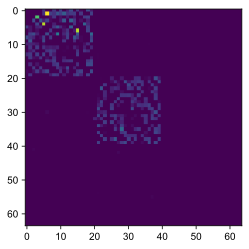

In [37]:
plt.imshow(dpe.read(0))

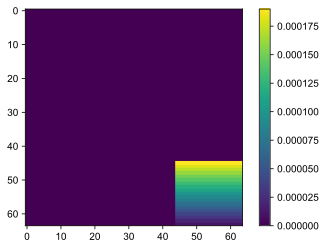

In [45]:
Gtarget = np.zeros((N,N))

for i in range(20):
    Gtarget[-i, -20:] = 200e-6/20 * i
    
plt.imshow(Gtarget); plt.colorbar()

Msel = Gtarget > 0

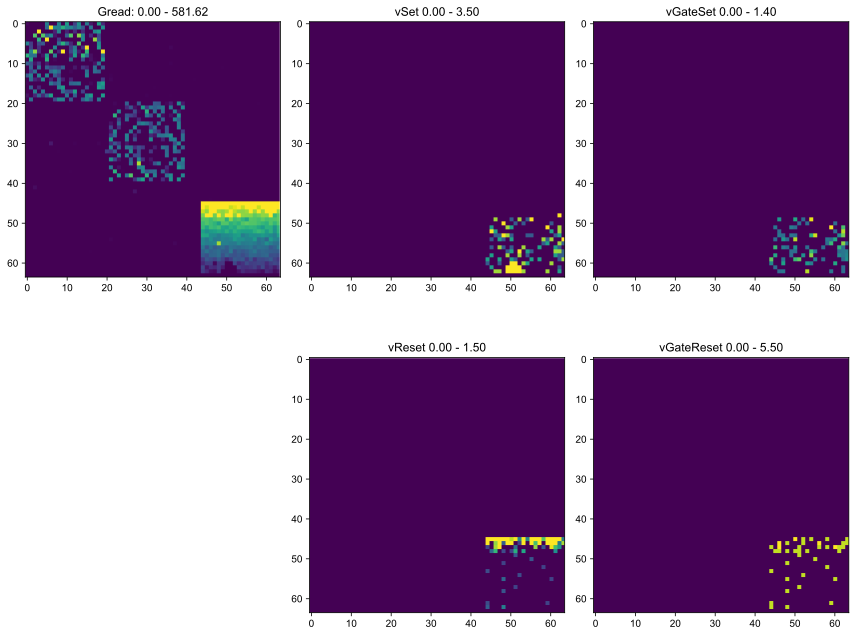

St-art programming, step=99, maxBound=43 yield= 53.16%
Setting 76 devices...
Programming with internal timing P_RESET=2
Resetting 40 devices...
Programming with internal timing P_RESET=2


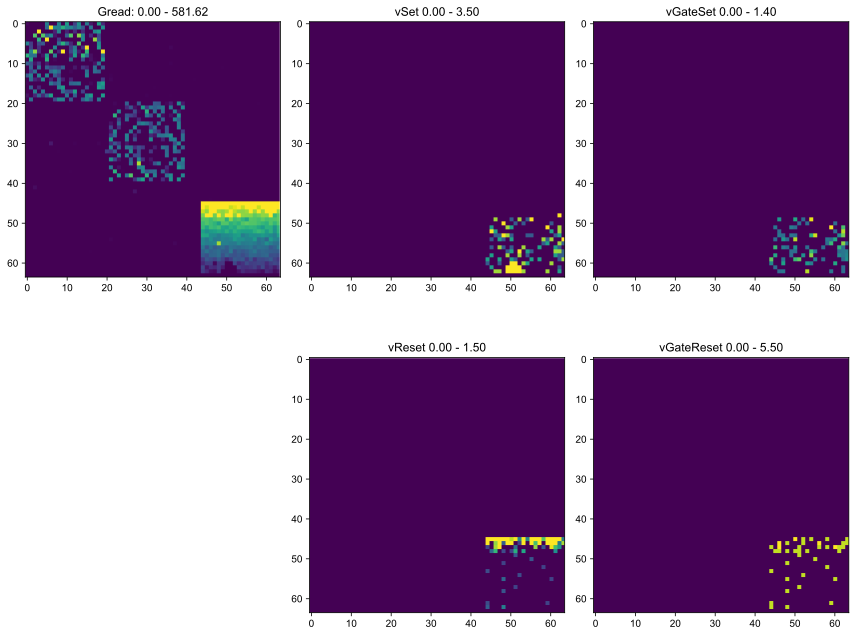

In [47]:
data = dpe.tune_conductance(0,  Gtarget, saveHistory=True, maxSteps=100, method='slow', plot_callback=myplot,
#                            vSetRamp=[1, 5.5, 1], 
#                             Twidth=1e-3, 
                            Msel=Msel)

In [48]:
save_workspace(vars(), note='gradient-slow-array0')

Saving In(<class 'list'>), Out(<class 'dict'>), g(<class 'numpy.ndarray'>), N(<class 'int'>), c(<class 'int'>), Gtarget(<class 'numpy.ndarray'>), Msel(<class 'numpy.ndarray'>), data(<class 'dict'>), num(<class 'int'>), x(<class 'int'>), y(<class 'int'>), g_all(<class 'numpy.ndarray'>), n(<class 'int'>), y_std(<class 'numpy.ndarray'>), vec(<class 'numpy.ndarray'>), i(<class 'int'>), to 20200107-182100-gradient-slow-array0.pkl
Saving In(<class 'list'>), g(<class 'numpy.ndarray'>), N(<class 'int'>), c(<class 'int'>), Gtarget(<class 'numpy.ndarray'>), Msel(<class 'numpy.ndarray'>), num(<class 'int'>), x(<class 'int'>), y(<class 'int'>), g_all(<class 'numpy.ndarray'>), n(<class 'int'>), y_std(<class 'numpy.ndarray'>), vec(<class 'numpy.ndarray'>), i(<class 'int'>), to 20200107-182100-gradient-slow-array0.mat


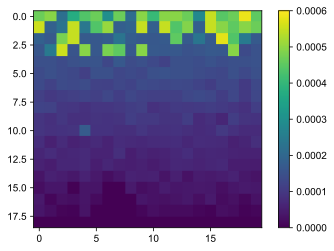

In [158]:
g = data['Ghist'][-1][-19:,-20:]
plt.imshow(g, clim=(0, 600e-6))
plt.colorbar()

In [69]:
arr = 0

Ggrad = np.zeros((19, 20))

Vgate = 5
Vref = 0.5
numReads = 100
vRead = 0.2

with serial.Serial(dpe.ser_name, 9600, timeout=1) as ser:
    dpe.a0.dut.connect(ser)
    a0 = dpe.a0
    
    for rr in range(19):
        print(rr)
        for cc in range(20):
            Ggrad[rr, cc] = a0.read_single_int(vRead, Vgate, array=arr, row=45+rr, col=44+cc, gain=-1) / vRead

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


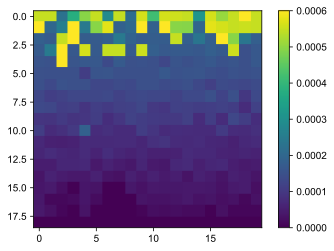

In [157]:
plt.imshow(Ggrad, clim=(0, 600e-6))
plt.colorbar()

In [83]:
r_sel = np.empty(21, dtype=np.int)
c_sel = np.empty(21, dtype=np.int)

for i in range(21):
    g_sel = 10e-6 * i
    
    g_diff = np.inf

    for rr in range(19):
        for cc in range(20):
            if np.abs(Ggrad[rr,cc] - g_sel) < g_diff and Ggrad[rr,cc] != 0:
                g_diff = np.abs(Ggrad[rr,cc] - g_sel)
                r_sel[i] = rr
                c_sel[i] = cc

In [84]:
for i in range(21):
    print(Ggrad[r_sel[i], c_sel[i] ] * 1e6 )

0.03421309872922773
9.648093841642229
19.843597262952102
30.10752688172043
40.029325513196476
50.72091886608015
59.787390029325515
69.70918866080156
77.92033235581621
91.23492994460734
100.35842293906808
110.05213424568261
119.74584555229717
130.00977517106548
141.41414141414143
150.53763440860217
158.5206907787553
169.9250570218312
177.90811339198433
188.17204301075267
200.7168458781362


In [85]:
with serial.Serial(dpe.ser_name, 9600, timeout=1) as ser:
    dpe.a0.dut.connect(ser)
    a0 = dpe.a0
    
    g_all = []
    
    for i in range(100):
        print(i, end='-')
    
        g = []

        for i in range(21):
            rr = r_sel[i]
            cc = c_sel[i]
            g.append( a0.read_single_int(vRead, Vgate, array=arr, row=45+rr, col=44+cc, gain=-1) / vRead )
            
        g_all.append(g)

0-1-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-17-18-19-20-21-22-23-24-25-26-27-28-29-30-31-32-33-34-35-36-37-38-39-40-41-42-43-44-45-46-47-48-49-50-51-52-53-54-55-56-57-58-59-60-61-62-63-64-65-66-67-68-69-70-71-72-73-74-75-76-77-78-79-80-81-82-83-84-85-86-87-88-89-90-91-92-93-94-95-96-97-98-99-

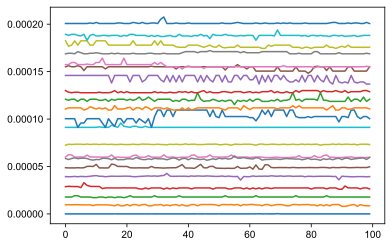

In [89]:
g_all = np.array(g_all)
for i in range(21):
    plt.plot(np.arange(0, 100), g_all[:,i].reshape(-1))

In [93]:
# retention test
import time
ts = time.time()

with serial.Serial(dpe.ser_name, 9600, timeout=1) as ser:
    dpe.a0.dut.connect(ser)
    a0 = dpe.a0
    
    g_all = []
    t_all = []
    
    for i in range(1000):
    
        g = np.empty((19,20))
        for rr in range(19):
            for cc in range(20):
                g[rr,cc] = a0.read_single_int(vRead, Vgate, array=arr, row=45+rr, col=44+cc, gain=-1) / vRead
            
        g_all.append(g)
        t_all.append(time.time()-ts)
        display.clear_output()
        print(f'i={i}, t={t_all[-1]} s')


i=999, t=27241.01454424858 s


Text(0.5, 0, 'Time (hours)')

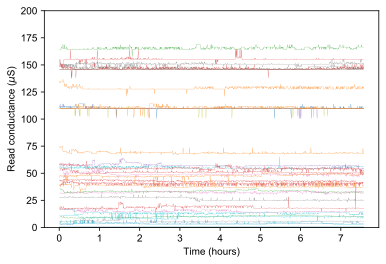

In [154]:
g_all = np.array(g_all)
t_all = np.array(t_all)
g_all.shape

gg = g_all.reshape(1000, -1).T


for g in gg[np.random.choice(gg.shape[0], 360, replace=False), :]:
    if np.std(g) < 1.5e-6:
        plt.plot(t_all/3600, g * 1e6, linewidth=0.2)
    
    
plt.ylim(0, 200)
plt.ylabel('Read conductance ($\mu$S)')
plt.xlabel('Time (hours)')
# plt.yscale('log')

In [119]:
gg = g_all.reshape(1000, -1).T
gg.shape

(380, 1000)

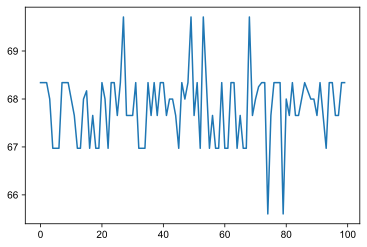

In [103]:
x = 31
y = 35
plt.plot(range(100),np.array(g_all4)[:,x,y].reshape(-1) * 1e6)

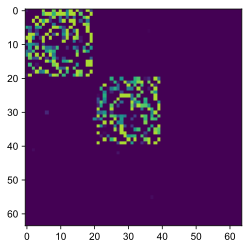

current i=99


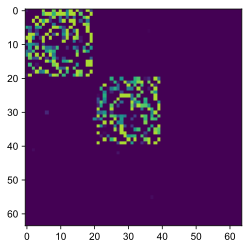

In [106]:
g_all5 = []

for i in range(100):
    g = dpe.read(0, method='slow', gain=3)
    g_all5.append(g)
    
    plt.imshow(g, clim=(0, 100e-6))
    display.clear_output(wait=True)
    display.display(plt.gcf())
    print(f'current i={i}')

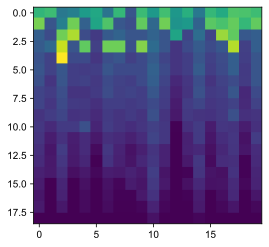

In [132]:
g_fast = dpe.read(0, method='fast')

g_fast = g_fast[-19:,-20:]
plt.imshow(g_fast)

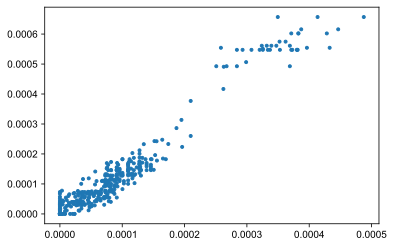

In [137]:
plt.plot( g_fast.reshape(-1), Ggrad.reshape(-1), '.' )

Reading vr=0.1
0-10-20-30-40-50-60-70-80-90-100-110-120-130-140-150-160-170-180-190-200-210-220-230-240-250-260-270-280-290-300-310-320-330-340-350-360-370-380-390-400-410-420-430-440-450-460-470-480-490-500-510-520-530-540-550-560-570-580-590-600-610-620-630-640-650-660-670-680-690-700-710-720-730-740-750-760-770-780-790-800-810-820-830-840-850-860-870-880-890-900-910-920-930-940-950-960-970-980-990-mean std = 1.1683996350434043e-06
Reading vr=0.15000000000000002
0-10-20-30-40-50-60-70-80-90-100-110-120-130-140-150-160-170-180-190-200-210-220-230-240-250-260-270-280-290-300-310-320-330-340-350-360-370-380-390-400-410-420-430-440-450-460-470-480-490-500-510-520-530-540-550-560-570-580-590-600-610-620-630-640-650-660-670-680-690-700-710-720-730-740-750-760-770-780-790-800-810-820-830-840-850-860-870-880-890-900-910-920-930-940-950-960-970-980-990-mean std = 1.2793711631572522e-06
Reading vr=0.20000000000000004
0-10-20-30-40-50-60-70-80-90-100-110-120-130-140-150-160-170-180-190-200-210-

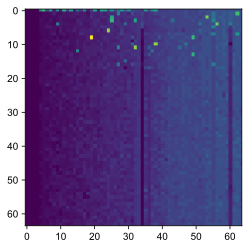

In [5]:
# Voltage experiments

plt.imshow(dpe.read(1, method='fast'))

g_all_volts = []
volts = np.arange(0.1, 0.51, 0.05)

for vr in volts:
    print(f'Reading vr={vr}')
    g_tmp = []
    for i in range(1000):
        g = dpe.read(1, Vread=vr, method='fast')
        g_tmp.append(g)
        if i%10 == 0:
            print(i, end='-')
    g_tmp = np.array(g_tmp)
    g_all_volts.append(g_tmp)
    
    print(f'mean std = { np.mean(np.std(g_tmp.reshape(1000, -1), axis=0)) }')

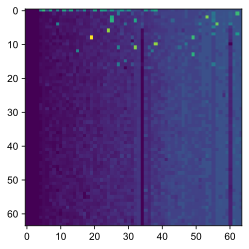

In [171]:
for vr in volts:

In [6]:
g_all_volts = np.array(g_all_volts)

In [7]:
save_workspace(vars(), note='Vread-reliability')

Saving In(<class 'list'>), Out(<class 'dict'>), g(<class 'numpy.ndarray'>), g_all_volts(<class 'numpy.ndarray'>), volts(<class 'numpy.ndarray'>), vr(<class 'numpy.float64'>), g_tmp(<class 'numpy.ndarray'>), i(<class 'int'>), to 20200108-171713-Vread-reliability.pkl
Saving In(<class 'list'>), g(<class 'numpy.ndarray'>), g_all_volts(<class 'numpy.ndarray'>), volts(<class 'numpy.ndarray'>), vr(<class 'numpy.float64'>), g_tmp(<class 'numpy.ndarray'>), i(<class 'int'>), to 20200108-171713-Vread-reliability.mat


In [37]:
plt.figure(figsize=(10,7))

num = 1

for v, g_all in zip(volts, g_all_volts):
#     print(f'{v:.2f}')
#     print(g_all.shape)
    
    plt.subplot(3,3,num)
    plt.ylim((0, 200))
    num +=1
    gg = g_all.reshape(1000, -1).T

    for g in gg[np.random.choice(gg.shape[0], 50, replace=False), :]:
        if np.std(g) < 1.5e-6:
            plt.plot( g * 1e6, linewidth=0.2)

<ipython-input-34-331fbe658387>:13: RuntimeWarning: invalid value encountered in less
  gg_std[gg_std < 0.1] = np.nan


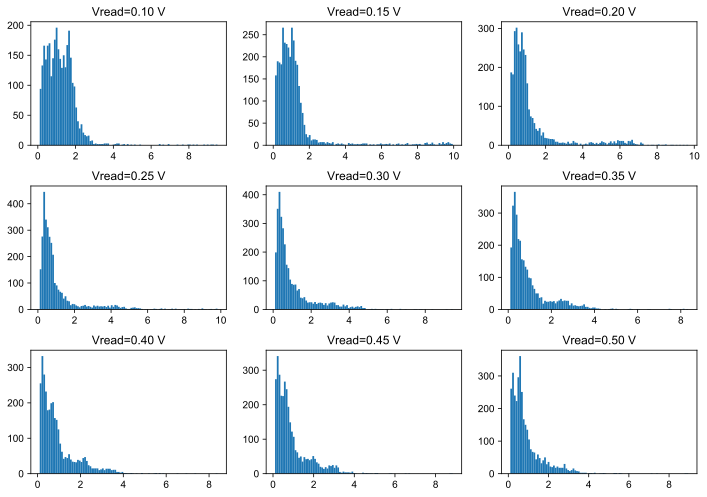

In [34]:
plt.figure(figsize=(10,7))

num = 1

for v, g_all in zip(volts, g_all_volts):
    
    plt.subplot(3,3,num)
    num +=1
    gg = g_all.reshape(1000, -1).T

    gg_std = np.std(gg, axis=1) * 1e6
    gg_std[gg_std > 10] = np.nan
    gg_std[gg_std < 0.1] = np.nan
    plt.hist(gg_std, 100 )
    plt.title(f'Vread={v:.2f} V')
#     plt.xlim(0, 10)

plt.tight_layout()

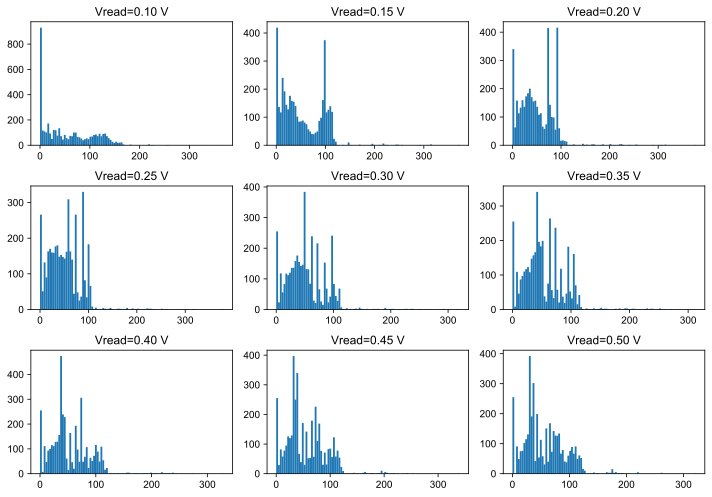

In [35]:
plt.figure(figsize=(10,7))

num = 1

for v, g_all in zip(volts, g_all_volts):
    
    plt.subplot(3,3,num)
    num +=1
    gg = g_all.reshape(1000, -1).T

    gg_mean = np.mean(gg, axis=1) * 1e6
#     gg_std[gg_std > 10] = np.nan
#     gg_std[gg_std < 0.1] = np.nan
    plt.hist(gg_mean, 100 )
    plt.title(f'Vread={v:.2f} V')
#     plt.xlim(0, 10)

plt.tight_layout()

In [40]:
# Voltage experiments

g_dist = []
volts = np.arange(0.1, 0.51, 0.05)

for vr in volts:
    print(f'Reading vr={vr}')
    g_tmp = []
    for i in range(100):
        _ = dpe.read(1, Vread=vr, method='fast')

    for i in range(10):
        g_tmp.append(dpe.read(1, method='fast'))
    g_tmp = np.array(g_tmp)
    g_tmp = np.mean(g_tmp, axis=0)
    g_dist.append(g_tmp)

Reading vr=0.1
Reading vr=0.15000000000000002
Reading vr=0.20000000000000004
Reading vr=0.25000000000000006
Reading vr=0.30000000000000004
Reading vr=0.3500000000000001
Reading vr=0.40000000000000013
Reading vr=0.45000000000000007
Reading vr=0.5000000000000001


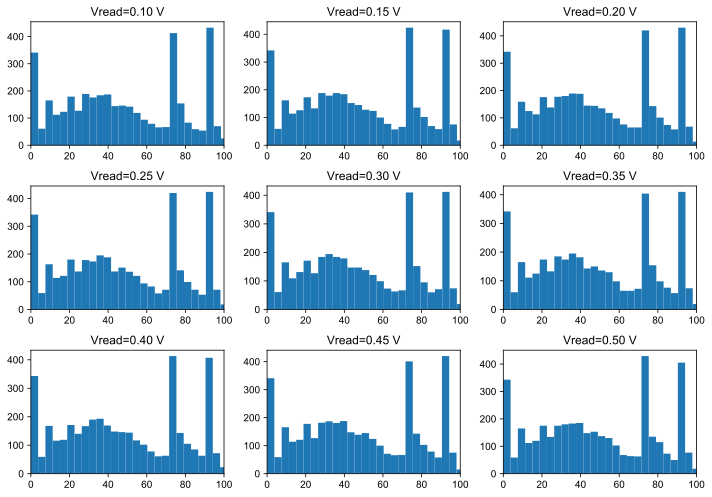

In [44]:
plt.figure(figsize=(10,7))

num = 1

for v, g_all in zip(volts, g_dist):
    
    plt.subplot(3,3,num)
    num +=1
#     gg = g_all.reshape(1000, -1).T

#     gg_mean = np.mean(gg, axis=1) * 1e6
    gg_mean = g_all.reshape(-1) * 1e6
#     gg_std[gg_std > 10] = np.nan
#     gg_std[gg_std < 0.1] = np.nan
    plt.hist(gg_mean, 100 )
    plt.title(f'Vread={v:.2f} V')
    plt.xlim(0, 100)

plt.tight_layout()

In [45]:
save_workspace(vars(), note='Vread-reliability')

Saving In(<class 'list'>), Out(<class 'dict'>), g(<class 'numpy.ndarray'>), g_all_volts(<class 'numpy.ndarray'>), volts(<class 'numpy.ndarray'>), vr(<class 'numpy.float64'>), g_tmp(<class 'numpy.ndarray'>), i(<class 'int'>), v(<class 'numpy.float64'>), g_all(<class 'numpy.ndarray'>), num(<class 'int'>), gg(<class 'numpy.ndarray'>), gg_std(<class 'numpy.ndarray'>), g_new(<class 'numpy.ndarray'>), gg_mean(<class 'numpy.ndarray'>), g_dist(<class 'list'>), to 20200108-181038-Vread-reliability.pkl
Saving In(<class 'list'>), g(<class 'numpy.ndarray'>), g_all_volts(<class 'numpy.ndarray'>), volts(<class 'numpy.ndarray'>), vr(<class 'numpy.float64'>), g_tmp(<class 'numpy.ndarray'>), i(<class 'int'>), v(<class 'numpy.float64'>), g_all(<class 'numpy.ndarray'>), num(<class 'int'>), gg(<class 'numpy.ndarray'>), gg_std(<class 'numpy.ndarray'>), g_new(<class 'numpy.ndarray'>), gg_mean(<class 'numpy.ndarray'>), g_dist(<class 'list'>), to 20200108-181038-Vread-reliability.mat


In [10]:
# retention test
import time
ts = time.time()

arr = 0

Vgate = 5
# Vref = 0.5
# numReads = 100
vRead = 0.2


with serial.Serial(dpe.ser_name, 9600, timeout=1) as ser:
    dpe.a0.dut.connect(ser)
    a0 = dpe.a0
    
    g_all = []
    t_all = []
    
    for i in range(4000):
    
        g = np.empty((19,20))
        for rr in range(19):
            for cc in range(20):
                g[rr,cc] = a0.read_single_int(vRead, Vgate, array=arr, row=45+rr, col=44+cc, gain=-1) / vRead
            
        g_all.append(g)
        t_all.append(time.time()-ts)
        display.clear_output()
        print(f'i={i}, t={t_all[-1]} s')
        
    if i%1000 == 0:
        save_workspace(vars(), note='retention')

i=0, t=98.37653350830078 s


KeyboardInterrupt: 

In [ ]:
# Fast read version
import time
ts = time.time()

    
g_all = []
t_all = []

for i in range(1800 * 24):
    
    t_last = time.time()

    g = dpe.read(0, method='fast')[-19:,-20:]
    g_all.append(g)
    t_all.append(time.time()-ts)
    display.clear_output()
    print(f'i={i}, t={t_all[-1]} s')
    
    while time.time() - t_last <2:
        pass
    
if i%3600 == 0:
    save_workspace(vars(), note='retention')

i=26952, t=54061.46984553337 s


Text(0.5, 0, 'Time (hours)')

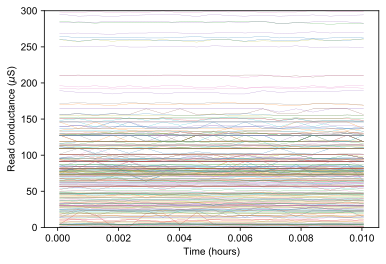

In [24]:
g_all = np.array(g_all)
t_all = np.array(t_all)
g_all.shape

gg = g_all.reshape(g_all.shape[0], -1).T


for g in gg[np.random.choice(gg.shape[0], 360, replace=False), :]:
#     if np.std(g) < 1.5e-6:
        plt.plot(t_all/3600, g * 1e6, linewidth=0.2)
    
    
plt.ylim(0, 300)
plt.ylabel('Read conductance ($\mu$S)')
plt.xlabel('Time (hours)')
# plt.yscale('log')

In [20]:
g_all.shape

(19, 19, 20)